# Spatial Data in Python

<br>
Spatial data is any type of data that directly or indirectly references a specific geographical area or location. Sometimes called geospatial data or geographic information, spatial data can also numerically represent a physical object in a geographic coordinate system.
<br>
<br>
GIS data integrates many different kinds of data layers using spatial location. Most data has a geographic component. GIS data includes imagery, features, and basemaps linked to spreadsheets and tables.

## Table of Contents
1. Vectorial Data
- a. Geopandas
- b. Folium
- c. Plotly
- d. Kepler lg
2. Raster Data
- a. Google Earth Engine (gee)
3. LiDAR
- a. View_lidar
 
 ![](https://miro.medium.com/max/1400/1*y8YJJOafQtrzU8zmmUxH3A.png)

## Vectorial Data

In [3]:
import pandas as pd
import geopandas as gpd
import os
import geemap
import matplotlib.pyplot as plt

import warnings
import keplergl
import numpy as np
import osmnx as ox
import plotly.express as px
from skgstat import Variogram
import matplotlib.pyplot as plt
from shapely.geometry import Point
from pykrige.ok import OrdinaryKriging
from scipy.interpolate import NearestNDInterpolator
#from tobler.area_weighted import area_interpolate
# Custom functions
#from scripts.utils import pixel2poly
# Plotting defaults
plt.style.use('ggplot')
px.defaults.height = 400; px.defaults.width = 620
plt.rcParams.update({'font.size': 16, 'axes.labelweight': 'bold', 'figure.figsize': (6, 6), 'axes.grid': False})

import folium
from folium.plugins import MarkerCluster
from folium import plugins
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap

![](https://github.com/TomasBeuzen/python-for-geospatial-analysis/blob/main/chapters/img/vector.png?raw=true)

## Geopandas

### Geometry - Points

#### Read data

In [4]:
airbnb_ny=pd.read_csv('http://data.insideairbnb.com/united-states/ny/new-york-city/2022-09-07/visualisations/listings.csv')
airbnb_ny.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,77765,Superior @ Box House,417504,The Box House Hotel,Brooklyn,Greenpoint,40.73777,-73.95366,Hotel room,308,2,42,2022-07-18,0.30,30,217,4,NaN
1,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64529,-73.97238,Private room,299,30,9,2018-10-19,0.11,9,356,0,NaN
2,45910,Beautiful Queens Brownstone! - 5BR,204539,Mark,Queens,Ridgewood,40.70309,-73.89963,Entire home/apt,425,30,13,2019-11-12,0.10,6,365,0,NaN
3,45935,Room in Beautiful Townhouse.,204586,L,Bronx,Mott Haven,40.80635,-73.92201,Private room,60,30,0,NaN,NaN,1,83,0,NaN
4,45936,Couldn't Be Closer To Columbia Uni,867225,Rahul,Manhattan,Morningside Heights,40.80630,-73.95985,Private room,75,31,135,2022-07-11,0.95,1,219,4,NaN


#### Create a GeoDataFrame

In [5]:
#create GeoDataFrame
gdf_airbnb_ny = gpd.GeoDataFrame(airbnb_ny, geometry=gpd.points_from_xy(airbnb_ny.longitude, airbnb_ny.latitude))
gdf_airbnb_ny.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry
0,77765,Superior @ Box House,417504,The Box House Hotel,Brooklyn,Greenpoint,40.73777,-73.95366,Hotel room,308,2,42,2022-07-18,0.30,30,217,4,NaN,POINT (-73.95366 40.73777)
1,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64529,-73.97238,Private room,299,30,9,2018-10-19,0.11,9,356,0,NaN,POINT (-73.97238 40.64529)
2,45910,Beautiful Queens Brownstone! - 5BR,204539,Mark,Queens,Ridgewood,40.70309,-73.89963,Entire home/apt,425,30,13,2019-11-12,0.10,6,365,0,NaN,POINT (-73.89963 40.70309)
3,45935,Room in Beautiful Townhouse.,204586,L,Bronx,Mott Haven,40.80635,-73.92201,Private room,60,30,0,NaN,NaN,1,83,0,NaN,POINT (-73.92201 40.80635)
4,45936,Couldn't Be Closer To Columbia Uni,867225,Rahul,Manhattan,Morningside Heights,40.80630,-73.95985,Private room,75,31,135,2022-07-11,0.95,1,219,4,NaN,POINT (-73.95985 40.80630)


![](images/geopandas.png)

In [6]:
gdf_airbnb_ny.dtypes

id                                   int64
name                                object
host_id                              int64
host_name                           object
neighbourhood_group                 object
neighbourhood                       object
latitude                           float64
longitude                          float64
room_type                           object
price                                int64
minimum_nights                       int64
number_of_reviews                    int64
last_review                         object
reviews_per_month                  float64
calculated_host_listings_count       int64
availability_365                     int64
number_of_reviews_ltm                int64
license                             object
geometry                          geometry
dtype: object

![](img/geopandas.png?raw=true)

<AxesSubplot:>

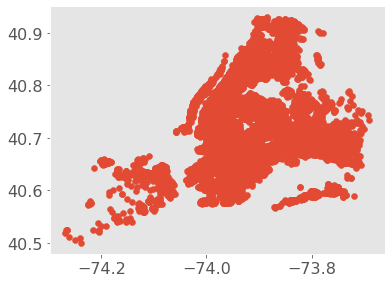

In [7]:
gdf_airbnb_ny.plot()

<AxesSubplot:>

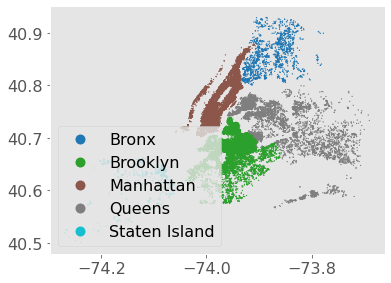

In [8]:
fig, ax = plt.subplots(1, 1)

gdf_airbnb_ny.plot(column='neighbourhood_group', ax=ax, legend=True, markersize=0.5)

In [9]:
#import contextily as ctx

gdf_airbnb_ny.plot(column='neighbourhood_group', ax=ax, legend=True, markersize=0.5)
#ctx.add_basemap(ax, zoom=12, source=ctx.providers.Stamen.TonerLite)

<AxesSubplot:>

<Figure size 432x432 with 0 Axes>

## Folium

In [11]:
Long=-73.90
Lat=40.70
locations = list(zip(airbnb_ny.latitude, airbnb_ny.longitude))

map1 = folium.Map(location=[Lat,Long], zoom_start=10)
FastMarkerCluster(data=locations).add_to(map1)
map1

#### Heat map

In [13]:
#Long=-73.90
#Lat=40.70

df_folium = pd.DataFrame({'Latitude':airbnb_ny['latitude'],'Longitude':airbnb_ny['longitude'],'Price':airbnb_ny['price']})


def generateBaseMap(loc, zoom=11, tiles='OpenStreetMap'):
    return folium.Map(location=loc,
                   control_scale=True, 
                   zoom_start=zoom,
                   tiles=tiles)
  
base_map = generateBaseMap([40.70,-73.90] ,)

map_values1 = df_folium[['Latitude','Longitude','Price']]

data = map_values1.values.tolist()
           
hm = HeatMap(data,gradient={0.1: 'blue', 0.3: 'lime', 0.5: 'yellow', 0.7: 'orange', 1: 'red'}, 
                min_opacity=0.05, 
                max_opacity=0.9, 
                radius=25,
                use_local_extrema=False)#.add_to(base_map)

base_map.add_child(hm)

### Geometry Polygon

In [15]:
ubc = (ox.geometries_from_place("University of British Columbia, Canada", tags={'building':True})
         .loc[:, ["geometry"]]                 # just keep the geometry column for now
         .query("geometry.type == 'Polygon'")  # only what polygons (buidling footprints)
         .assign(Label="Building Footprints")  # assign a label for later use
         .reset_index(drop=True)               # reset to 0 integer indexing
      )
ubc.head()

,geometry,Label
0,"POLYGON ((-123.25526 49.26695, -123.25506 49.2...",Building Footprints
1,"POLYGON ((-123.25328 49.26803, -123.25335 49.2...",Building Footprints
2,"POLYGON ((-123.25531 49.26859, -123.25493 49.2...",Building Footprints
3,"POLYGON ((-123.25403 49.26846, -123.25408 49.2...",Building Footprints
4,"POLYGON ((-123.25455 49.26906, -123.25398 49.2...",Building Footprints


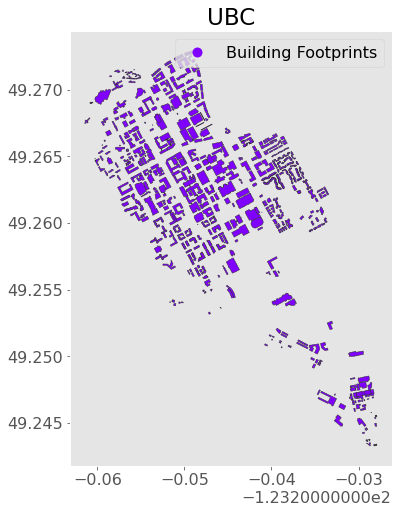

In [16]:
ax = ubc.plot(figsize=(8, 8), column="Label", legend=True,
              edgecolor="0.2", markersize=200, cmap="rainbow")
plt.title("UBC");

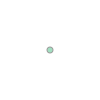

In [17]:
point_office = Point(-123.2522145, 49.2629555)
point_office

In [18]:
ubc[ubc.contains(point_office)]

,geometry,Label
47,"POLYGON ((-123.25217 49.26345, -123.25196 49.2...",Building Footprints


In [19]:
ubc.loc[47, "Label"] = "Tom's Office"

Text(0.5, 1.0, 'UBC')

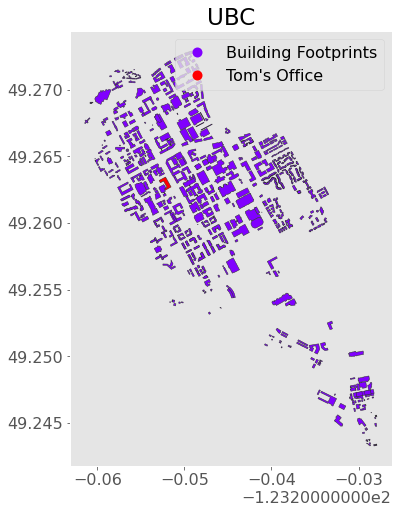

In [20]:
ax = ubc.plot(figsize=(8, 8), column="Label", legend=True,
              edgecolor="0.2", markersize=200, cmap="rainbow")
plt.title("UBC")

### Contextily con Geopandas

In [21]:
#import contextily as ctx

#ax = (ubc.to_crs("EPSG:3857")
#         .plot(figsize=(10, 8), column="Label", legend=True,
#               edgecolor="0.2", markersize=200, cmap="rainbow")
#     )
#ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)  # I'm using OSM as the source. See all provides with ctx.providers
#plt.axis("off")
#plt.title("UBC");

### Plotly and Geopandas

In [22]:
fig = px.choropleth_mapbox(ubc, geojson=ubc.geometry, locations=ubc.index, color="Label",
                           center={"lat": 49.261, "lon": -123.246}, zoom=12.5,
                           mapbox_style="open-street-map")
fig.update_layout(margin=dict(l=0, r=0, t=30, b=10))

C:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [24]:
fig = px.choropleth_mapbox(ubc, geojson=ubc.geometry, locations=ubc.index, color="Label",
                           center={"lat": 49.261, "lon": -123.246}, zoom=12.5,
                           mapbox_style="stamen-terrain")
fig.update_layout(margin=dict(l=0, r=0, t=30, b=10))

C:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [26]:
# Calculate area
ubc["Area"] = ubc.to_crs(epsg=3347).area  # note I'm projecting to EPSG:3347 (the projected system in meters that Statistics Canada useshttps://epsg.io/3347)

# Make plot
fig = px.choropleth_mapbox(ubc, geojson=ubc.geometry, locations=ubc.index, color="Area",
                           center={"lat": 49.261, "lon": -123.246}, zoom=12.5,
                           mapbox_style="carto-positron")
fig.update_layout(margin=dict(l=0, r=0, t=30, b=10))

C:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



### Kepler.gl

In [27]:
#!conda install -y -c conda-forge/label/cf202003 nodejs
#!jupyter labextension install @jupyter-widgets/jupyterlab-manager keplergl-jupyter

In [29]:
ubc_map2 = keplergl.KeplerGl(height=500)
ubc_map2.add_data(data=ubc.copy(), name="Building heights")
ubc_map2


User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Building heights': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18…

In [31]:
ubc_bldg_heights = gpd.read_file("data/building-footprints-2009.shp")
ubc_bldg_heights.head()

,id,orient8,bldgid,topelev_m,med_slope,baseelev_m,hgt_agl,rooftype,area_m2,avght_m,minht_m,maxht_m,base_m,len,wid,geometry
0,158502.0,26.7542,112433.0,97.55,4.0,80.01,17.54,Flat,2085.07,13.70,0.00,21.76,81.40,110.61,41.11,"POLYGON ((-123.25550 49.26127, -123.25544 49.2..."
1,158503.0,26.7542,112433.0,100.58,13.0,81.50,19.08,Flat,2085.07,13.70,0.00,21.76,81.40,110.61,41.11,"POLYGON ((-123.25561 49.26111, -123.25578 49.2..."
2,158506.0,27.5790,112852.0,122.32,5.0,93.04,29.28,Flat,4116.37,18.02,0.03,30.55,93.73,67.22,66.37,"POLYGON ((-123.24859 49.26136, -123.24850 49.2..."
3,158508.0,28.2727,120767.0,109.85,1.0,90.51,19.33,Flat,5667.17,17.95,0.17,31.16,89.19,155.53,59.50,"POLYGON ((-123.25340 49.26482, -123.25351 49.2..."
4,158509.0,28.5496,122507.0,112.69,27.0,86.63,26.07,Pitched,1349.35,18.26,0.00,27.34,87.79,64.92,26.47,"POLYGON ((-123.25520 49.26655, -123.25524 49.2..."


In [32]:
ubc_bldg_heights = (gpd.sjoin(ubc, ubc_bldg_heights[["hgt_agl", "geometry"]], how="inner")
                       .drop(columns="index_right")
                       .rename(columns={"hgt_agl": "Height"})
                       .reset_index()
                       .dissolve(by="index", aggfunc="mean")  # dissolve is like "groupby" in pandas. We use it because it retains geometry information
                   )

In [35]:
ubc_height_map = keplergl.KeplerGl(height=600)
ubc_height_map.add_data(data=ubc_bldg_heights.copy(), name="Building heights")
ubc_height_map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Building heights': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18…

# Raster

![](https://github.com/TomasBeuzen/python-for-geospatial-analysis/blob/main/chapters/img/raster.png?raw=true)

![](https://github.com/TomasBeuzen/python-for-geospatial-analysis/blob/main/chapters/img/raster-resolution.png?raw=true)

In [36]:
import ee

# Trigger the authentication flow.
ee.Authenticate()

# Initialize the library.
ee.Initialize()

Enter verification code: 4/1AfgeXvu5KKL5COGbrrENqhPuD9Yw_tstePs-ATxzYUSTb9ryGRB2ZFlRpJQ

Successfully saved authorization token.


In [37]:
import folium
import geehydro

In [39]:
Map=folium.Map(location=[40,-100], zoom_start=4)
#Map.setOptions('HYBRID')
Map.setOptions('SATELLITE')

In [40]:
# Create a map centered at (lat, lon).
Map = geemap.Map(center=[40, -100], zoom=4)

# This function gets NDVI from Landsat 5 imagery.


def getNDVI(image):
    return image.normalizedDifference(['B4', 'B3'])


# Load two Landsat 5 images, 20 years apart.
image1 = ee.Image('LANDSAT/LT05/C01/T1_TOA/LT05_044034_19900604')
image2 = ee.Image('LANDSAT/LT05/C01/T1_TOA/LT05_044034_20100611')

# Compute NDVI from the scenes.
ndvi1 = getNDVI(image1)
ndvi2 = getNDVI(image2)

# Compute the difference in NDVI.
ndviDifference = ndvi2.subtract(ndvi1)

ndviParams = {'palette': ['#d73027', '#f46d43', '#fdae61',
                          '#fee08b', '#d9ef8b', '#a6d96a', '#66bd63', '#1a9850']}
ndwiParams = {'min': -0.5, 'max': 0.5, 'palette': ['FF0000', 'FFFFFF', '0000FF']}


Map.centerObject(image1, 10)
Map.addLayer(ndvi1, ndviParams, 'NDVI 1')
Map.addLayer(ndvi2, ndviParams, 'NDVI 2')
Map.addLayer(ndviDifference, ndwiParams, 'NDVI difference')

# Display the map.
Map

Map(center=[37.48485265576669, -122.16351718401654], controls=(WidgetControl(options=['position', 'transparent…

# LiDAR

In [41]:
url = (
    'https://drive.google.com/file/d/1H_X1190vL63BoFYa_cVBDxtIa8rG-Usb/view?usp=sharing'
)
filename = 'madison.las'

In [42]:
#if not os.path.exists(filename):
    #geemap.download_file(url, 'madison.zip', unzip=True)

#geemap.download_file(url, 'madison.zip', unzip=True)

In [44]:
import geemap

lidar='data/madison.las'
las = geemap.read_lidar(lidar)

In [45]:
las.header

<LasHeader(1.3, <PointFormat(1, 0 bytes of extra dims)>)>

In [47]:
print("Está conformado por : ", las.header.point_count, " puntos")

Está conformado por :  4068294  puntos


In [48]:
list(las.point_format.dimension_names)

['X',
 'Y',
 'Z',
 'intensity',
 'return_number',
 'number_of_returns',
 'scan_direction_flag',
 'edge_of_flight_line',
 'classification',
 'synthetic',
 'key_point',
 'withheld',
 'scan_angle_rank',
 'user_data',
 'point_source_id',
 'gps_time']

In [50]:
las.X

array([5324343, 5324296, 5323993, ..., 5784049, 5784359, 5784667])

In [51]:
las.Y

array([8035264, 8035347, 8035296, ..., 7550110, 7550066, 7550026])

In [53]:
las.Z

array([36696, 34835, 34826, ..., 36839, 36858, 36842])

In [54]:
las.intensity

array([ 9, 41, 24, ..., 87, 80, 95], dtype=uint16)

In [55]:
las.classification

<SubFieldView([4 2 2 ... 2 2 2])>

In [56]:
geemap.view_lidar(lidar, cmap='terrain', backend='pyvista')

ViewInteractiveWidget(height=768, layout=Layout(height='auto', width='100%'), width=1024)